In [1]:
# %pip install -U sentence-transformers
# %pip install plotly
from sentence_transformers import SentenceTransformer

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import calinski_harabasz_score
from sklearn.ensemble import IsolationForest

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

## Data

In [2]:
df = pd.read_csv("./preprocessed_data.csv")
# df.drop_duplicates(subset="speeches", inplace=True)
df.head()

,speaker_id,speeches,party_id,party_name,county,orientation,sex
0,#MireiaBorrásPabón,Good afternoon ladies and gentlemen Mr Echeniq...,#party.Vox,Vox,ES,#orientation.RRF,F
1,#MireiaBorrásPabón,Thank you President Good morning ladies and ge...,#party.Vox,Vox,ES,#orientation.RRF,F
2,#MireiaBorrásPabón,Thank you President Good afternoon deputies Th...,#party.Vox,Vox,ES,#orientation.RRF,F
3,#MireiaBorrásPabón,Thank you President Good afternoon ladies and ...,#party.Vox,Vox,ES,#orientation.RRF,F
4,#MireiaBorrásPabón,In what part of the menu are the worms and pro...,#party.Vox,Vox,ES,#orientation.RRF,F


## Sentence Embedding

In [4]:
sentence_model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

speeches = df["speeches"]
X = sentence_model.encode(speeches)

## Dimensional Reduction

In [5]:
dim = 2

# reductor = PCA(dim)
reductor = TSNE(dim)

X_emb = reductor.fit_transform(X)
df[[f"x{i}" for i in range(dim)]] = X_emb
df.head()

,speaker_id,speeches,party_id,party_name,county,orientation,sex,x0,x1
0,#MireiaBorrásPabón,Good afternoon ladies and gentlemen Mr Echeniq...,#party.Vox,Vox,ES,#orientation.RRF,F,-4.604864,-42.382481
1,#MireiaBorrásPabón,Thank you President Good morning ladies and ge...,#party.Vox,Vox,ES,#orientation.RRF,F,-6.713987,-34.886299
2,#MireiaBorrásPabón,Thank you President Good afternoon deputies Th...,#party.Vox,Vox,ES,#orientation.RRF,F,-2.967614,-41.776554
3,#MireiaBorrásPabón,Thank you President Good afternoon ladies and ...,#party.Vox,Vox,ES,#orientation.RRF,F,-3.944038,-40.936310
4,#MireiaBorrásPabón,In what part of the menu are the worms and pro...,#party.Vox,Vox,ES,#orientation.RRF,F,-24.098171,-29.332644


## Clustering

In [6]:
ks = []
calinski = []
inertias = []

for k in range(3, 18):
    model = KMeans(k)
    clusters = model.fit_predict(X_emb)

    ks.append(k)
    inertias.append(model.inertia_)
    calinski.append(calinski_harabasz_score(X_emb, clusters))

best_i = np.argmax(calinski)
best_k = ks[best_i]

C:\Users\ruben\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\ruben\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\ruben\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\ruben\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\ruben\anaconda3\Lib\site-packages\sklearn\clust

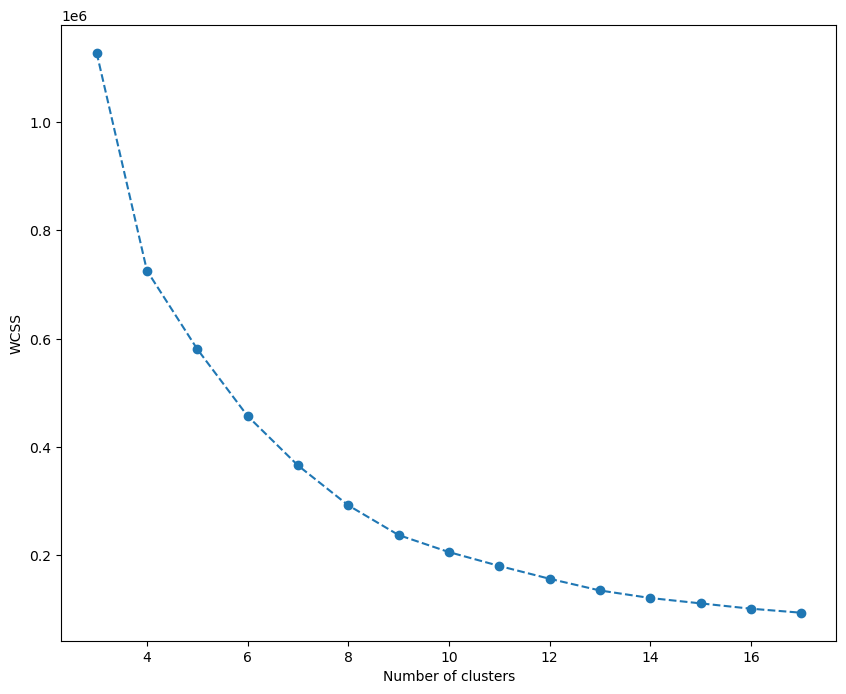

In [7]:
plt.figure(figsize=(10, 8))
plt.plot(ks, inertias, marker='o', linestyle='--')
plt.xlabel("Number of clusters")
plt.ylabel("WCSS")

plt.show()

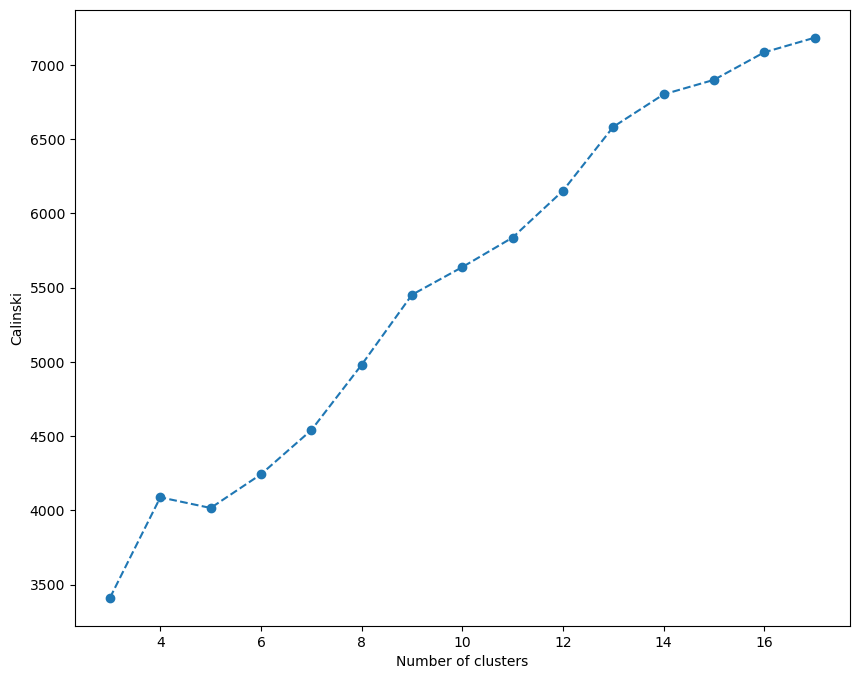

In [8]:
plt.figure(figsize=(10, 8))
plt.plot(ks, calinski, marker='o', linestyle='--')
plt.xlabel("Number of clusters")
plt.ylabel("Calinski")

plt.show()

In [9]:
selected_k = 7

model = KMeans(selected_k)
clusters = model.fit_predict(X_emb)

df["cluster"] = clusters
df.head()

C:\Users\ruben\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,speaker_id,speeches,party_id,party_name,county,orientation,sex,x0,x1,cluster
0,#MireiaBorrásPabón,Good afternoon ladies and gentlemen Mr Echeniq...,#party.Vox,Vox,ES,#orientation.RRF,F,-4.604864,-42.382481,6
1,#MireiaBorrásPabón,Thank you President Good morning ladies and ge...,#party.Vox,Vox,ES,#orientation.RRF,F,-6.713987,-34.886299,6
2,#MireiaBorrásPabón,Thank you President Good afternoon deputies Th...,#party.Vox,Vox,ES,#orientation.RRF,F,-2.967614,-41.776554,6
3,#MireiaBorrásPabón,Thank you President Good afternoon ladies and ...,#party.Vox,Vox,ES,#orientation.RRF,F,-3.944038,-40.936310,6
4,#MireiaBorrásPabón,In what part of the menu are the worms and pro...,#party.Vox,Vox,ES,#orientation.RRF,F,-24.098171,-29.332644,2


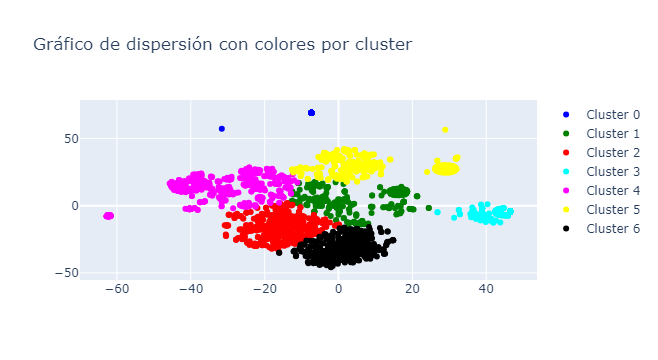

In [10]:
import plotly.graph_objects as go

colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'white', 'orange', 'purple', 'pink', 'gray', 'brown']
color_dict = dict(zip(range(len(colors)), colors))

fig = go.Figure()
for cluster in range(selected_k):
    cluster_data = df[df['cluster'] == cluster]
    fig.add_trace(go.Scatter(
        x=cluster_data['x0'],
        y=cluster_data['x1'],
        mode='markers',
        marker=dict(color=color_dict[cluster]),
        name=f'Cluster {cluster}',
        text=cluster_data['speeches']
    ))

fig.update_layout(
    title='Gráfico de dispersión con colores por cluster',
)

fig.show()

In [11]:
df.to_csv("clusters.csv", index=False)

In [12]:
with open("stopwordlist_en.txt", 'r') as f:
    stopwords = f.read().split("\n")
stopwords

['a',
 'also',
 'therefore',
 "'s",
 'about',
 'above',
 'after',
 'again',
 'against',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 "can't",
 'cannot',
 'could',
 "couldn't",
 'did',
 "didn't",
 'do',
 'does',
 "doesn't",
 'doing',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 "hadn't",
 'has',
 "hasn't",
 'have',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 "he's",
 'her',
 'here',
 "here's",
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 "how's",
 'i',
 "i'd",
 "i'll",
 "i'm",
 "i've",
 'if',
 'in',
 'into',
 'is',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 "let's",
 'me',
 'more',
 'most',
 "mustn't",
 'my',
 'myself',
 'no',
 'nor',
 'not',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'ought',
 'our',
 'ours \t',
 'ourselves',
 'out',
 'over',
 'own',
 'same',
 "shan't",
 'she',
 "she'd",
 "

In [14]:
from wordcloud import WordCloud

In [15]:
from collections import Counter
from spacy.lang.en import English


def get_freqs(sentences, stopwords):
    counter = Counter()
    nlp = English()
    tokenizer = nlp.tokenizer

    for sentence in sentences:
        try:
            for word in tokenizer(sentence):
                if word.text.lower() not in stopwords:
                    counter[word.text.lower()] += 1
        except Exception as e:
            print(e)

    return counter

In [16]:
with open("stopwordlist_en.txt", 'r') as f:
    stopwords = f.read().split("\n")

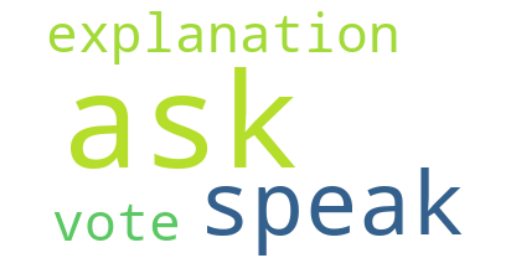

Argument 'string' has incorrect type (expected str, got float)
Argument 'string' has incorrect type (expected str, got float)


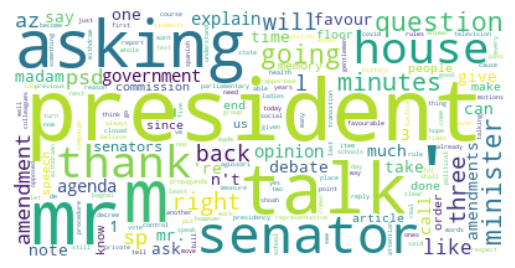

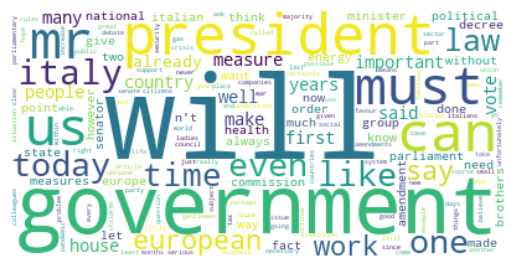

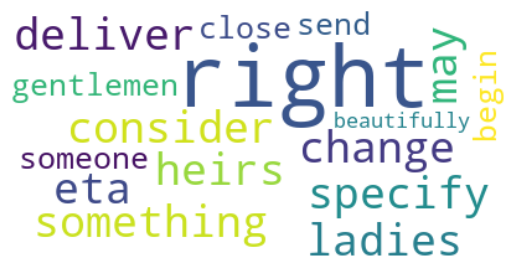

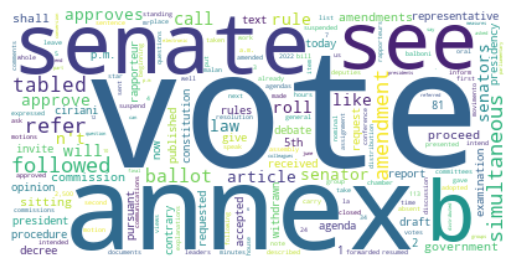

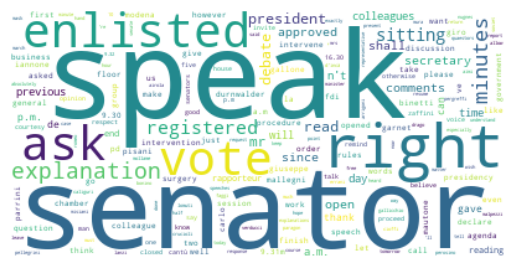

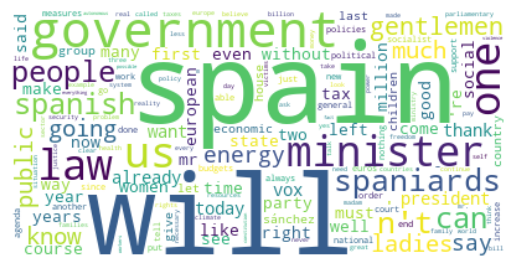

In [20]:
for i in range(selected_k):
    cluster_i = df[df["cluster"]==i]["speeches"]
    freqs = get_freqs(cluster_i, stopwords)
    wordcloud = WordCloud(background_color="white").generate_from_frequencies(freqs)
    
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.savefig(f"out/cluster{i}.png")
    plt.show()

In [21]:
for i in range(selected_k):
    cluster_i = df[df["cluster"]==i]["speeches"]
    cluster_i.to_csv(f"./out/cluster{i}.csv", index=False)